In [32]:
# import packages

import os, glob, time, itertools
import pandas as pd
from utils.helper import *
import datetime
import numpy as np
from sklearn import preprocessing
import statsmodels.formula.api as smf
import statsmodels.api as sm
import seaborn as sns
import math
import matplotlib.pyplot as plt
import pytz

%matplotlib inline

pwd = os.path.dirname(os.path.realpath('.'))

year = 2019 # change this for different dataset

# seting data path
folder_name = '/{}'.format(year)
data_folder = pwd +  '/Data'
data_year = data_folder + folder_name

In [17]:
data_year+'/speed_for_chunks/*'

'/Users/saeedarabi/Desktop/experiment/github/UoI/Data/2019/speed_for_chunks/*'

In [18]:
if folder_name == '/2018':
    list_of_speed_files_2018 = glob.glob(data_year+'/speed_for_chunks/*')
    list_of_csv_files_2018 = glob.glob(data_year+'/2018_results/*')
    annotations = pd.read_excel(data_year+'/annotation.xlsx')

if folder_name == '/2019':
    list_of_speed_files_2019 = glob.glob(data_year+'/speed_for_chunks/*')
    list_of_csv_files_2019 = glob.glob(data_year+'/2019_results/*')
    annotations = pd.read_excel(data_year+'/annotation.xlsx')

if folder_name == '/2017':
    list_of_speed_files_2017 = glob.glob(data_year+'/speed_for_chunks/*')
    list_of_csv_files_2017 = glob.glob(data_year+'/2017_results/*')
    annotations = pd.read_excel(data_year+'/annotation.xlsx')
len(list_of_csv_files_2018)

4948

In [19]:
# filter unvalid files
annotations = annotations[annotations.is_valid == 'Y']

In [20]:
# change the file names based on the year
name_of_csv_files_2019 = [i.split('/')[-1].split('.')[0] for i in list_of_csv_files_2019]
valid_files = [i for i in annotations.filename]
cnt = 0
for i in valid_files:
    if i in name_of_csv_files_2019:
        cnt += 1
assert cnt == len(valid_files), "Not all the files found!"

In [15]:
!pwd

/Users/saeedarabi/Desktop/experiment/github/UoI/notebooks


file:  unit01_2019-10-14_12_48_57_1_5952
file:  unit01_2019-10-14_22_01_59_2_13560
file:  unit01_2019-10-14_22_01_59_3_17304
file:  unit01_2019-10-15_17_44_28_1_1
file:  unit01_2019-10-16_13_05_55_1_1
file:  unit01_2019-10-16_16_51_56_1_1
file:  unit01_2019-10-20_16_38_44_4_14808
file:  unit01_2019-10-25_19_46_28_1_10488
file:  unit01_2019-10-25_19_46_28_2_12168
file:  unit01_2019-10-26_17_31_49_1_1272
file:  unit01_2019-10-26_17_31_49_2_4224
file:  unit01_2019-10-27_16_51_53_1_1
file:  unit01_2019-10-27_16_51_53_3_5880
file:  unit01_2019-10-28_13_24_53_2_1128
file:  unit01_2019-11-10_19_03_43_2_20808
file:  unit01_2019-11-10_19_03_43_4_38928
file:  unit01_2019-11-10_21_08_38_1_1
file:  unit01_2019-11-10_21_08_38_2_888
file:  unit01_2019-11-10_21_41_28_1_7224
file:  unit01_2019-11-10_22_19_37_1_3144
file:  unit01_2019-11-14_22_22_35_10_59376
file:  unit01_2019-11-14_22_22_35_11_64392
file:  unit01_2019-11-14_22_22_35_12_74952
file:  unit01_2019-11-14_22_22_35_13_79296
file:  unit01_201

file:  unit11_2019-11-06_22_40_11_3_18768
file:  unit11_2019-11-06_22_40_11_4_24696
file:  unit11_2019-11-07_21_40_46_1_1
file:  unit11_2019-11-07_21_40_46_10_76968
file:  unit11_2019-11-07_21_40_46_2_1344
file:  unit11_2019-11-07_21_40_46_3_2520
file:  unit11_2019-11-07_21_40_46_4_21504
file:  unit11_2019-11-07_21_40_46_5_24360
285  files remained!
200  file processed!
file:  unit11_2019-11-09_18_01_20_1_1
file:  unit11_2019-11-09_20_14_27_2_3216
file:  unit11_2019-11-09_20_14_27_3_8064
file:  unit11_2019-11-09_20_14_27_4_10944
file:  unit11_2019-11-09_20_14_27_5_13176
file:  unit11_2019-11-09_20_44_38_1_240
file:  unit11_2019-12-03_21_51_53_1_4152
file:  unit11_2019-12-03_22_17_13_1_2208
file:  unit11_2019-12-03_22_44_44_1_6672
file:  unit11_2019-12-07_17_29_06_1_1
file:  unit11_2019-12-07_17_29_06_2_2256
file:  unit11_2019-12-07_17_29_06_3_6120
file:  unit11_2019-12-07_17_29_06_4_12384
file:  unit11_2019-12-07_22_25_09_1_1
file:  unit11_2019-12-07_22_25_09_2_3192
file:  unit11_2019-

file:  unit17_2019-11-10_22_05_53_2_3840
file:  unit17_2019-11-10_22_05_53_4_8856
file:  unit17_2019-12-07_16_51_19_4_24792
file:  unit17_2019-12-07_16_51_19_6_44688
file:  unit17_2019-12-07_16_51_19_7_54480
file:  unit17_2019-12-07_19_37_15_1_336
file:  unit17_2019-12-07_20_11_43_1_3936
file:  unit17_2019-12-07_20_30_50_1_1536
file:  unit17_2019-12-07_21_30_14_1_984
file:  unit17_2019-12-07_21_57_34_6_26616
file:  unit17_2019-12-13_16_26_01_3_2904
file:  unit17_2019-12-13_16_26_01_4_8568
file:  unit17_2019-12-13_17_09_53_3_9768
file:  unit17_2019-12-13_17_09_53_4_15816
file:  unit17_2019-12-13_17_09_53_5_20040
file:  unit18_2019-11-02_16_25_42_1_3480
file:  unit18_2019-11-02_16_25_42_16_85344
file:  unit18_2019-11-02_16_25_42_17_92472
file:  unit18_2019-11-02_16_25_42_18_94440
file:  unit18_2019-11-02_16_25_42_20_102696
file:  unit18_2019-11-02_16_25_42_21_108936
file:  unit18_2019-11-02_16_25_42_3_19392
file:  unit18_2019-11-02_16_25_42_4_21864
file:  unit18_2019-11-02_16_25_42_6_343

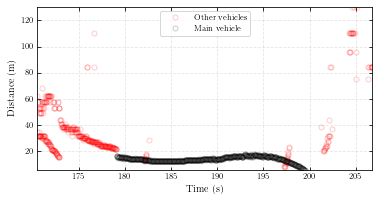

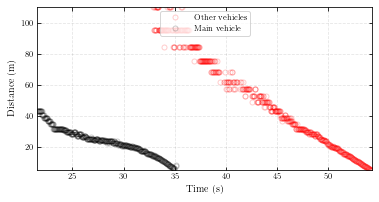

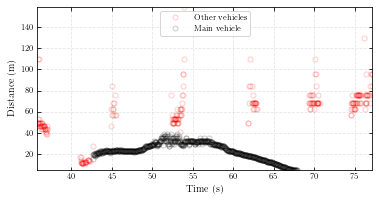

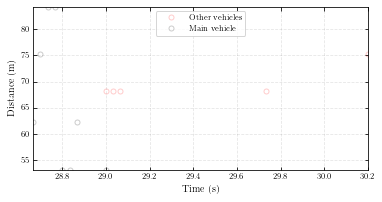

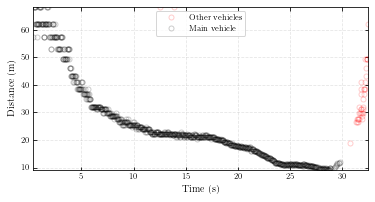

...

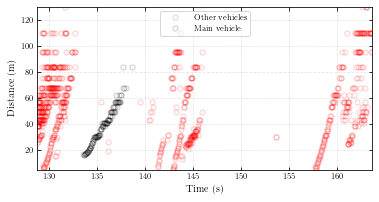

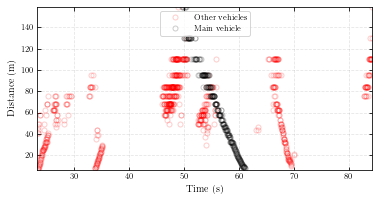

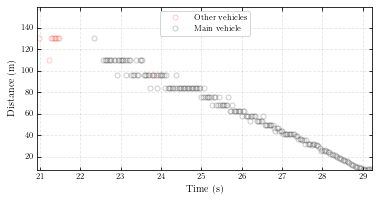

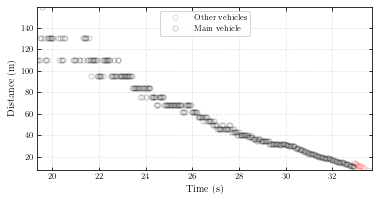

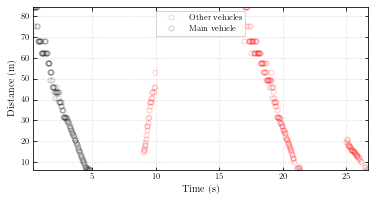

In [21]:
# Preparing dataset (the deep learning model will be imported here)

cnt = 0
dataset = pd.DataFrame()
not_processed = []
for j in annotations.filename:
    for i in name_of_csv_files_2018:
        if i == j:
            print("file: ", j)
            try:
                speed_file = [k for k in list_of_speed_files_2018 if k.split('/')[-1].split('.')[0][:-6] == j][0]
                df_raw_speed = prepare_speed_profiles_for_model(speed_file) #Check helper.py for this function

                file = [k for k in list_of_csv_files_2018 if k.split('/')[-1].split('.')[0] == j][0]
                df_detection = prepare_detections_for_model(file, df_raw_speed) #Check helper.py for this function
                #remove short videos
                if len(df_detection) < 20:
                    continue

                df_detection_f = merge_speed_and_detection(df_detection, df_raw_speed, annotations, filename=i) #Check helper.py for this function

                #UPDATE THIS TO USE DEEP MODEL
                df_detection_f['refined_dist'] = np.vectorize(dist_cal_by_model)(df_detection_f['H'], df_detection_f['Type of vehicle'])            
                phases, classes, segments, spline = detect_phases(df_detection_f.refined_dist, plot=False) #Check helper.py for this function               
                if type(phases) == int:
                    continue
                df_detection_f['phases'] = phases
                df_detection_f['spline_dist'] = spline
#                 plot_clustered(file)
#                 plt.show()
                dataset = pd.concat([dataset,df_detection_f])
                cnt += 1
            
            except:
                print('Could not process ', j)
                print('Speed profile could not be found!')
                not_processed.append(j)
                break
    
    if cnt%50 == 0:
        print(len(list_of_speed_files_2018)-cnt, " files remained!")
        print(cnt, ' file processed!')
#         break

In [47]:
dataset.head()

,frame_num,dist,center,H,datetime_time,Speed_MPH,filename,Type_of_vehicle,Type_of_road,phases,spline_dist,dist_standard,Speed_mps,hour,hour_standard,weekday
263737,2204,19.34875,645.914081,74,22:52:56,19.280525,unit11_2019-11-05_22_50_17_2_2616,PICKUP TRUCK,GRAVEL,Following,24.693771,-0.577425,8.619166,17,1.685246,weekday
263738,2205,19.34875,645.914081,74,22:52:56,19.248978,unit11_2019-11-05_22_50_17_2_2616,PICKUP TRUCK,GRAVEL,Following,24.685723,-0.577425,8.605063,17,1.685246,weekday
263739,2206,19.34875,645.914081,74,22:52:56,19.217431,unit11_2019-11-05_22_50_17_2_2616,PICKUP TRUCK,GRAVEL,Following,24.677567,-0.577425,8.590960,17,1.685246,weekday
263740,2207,19.34875,645.914081,74,22:52:56,19.185884,unit11_2019-11-05_22_50_17_2_2616,PICKUP TRUCK,GRAVEL,Following,24.669303,-0.577425,8.576857,17,1.685246,weekday
263741,2208,19.34875,644.821099,74,22:52:56,19.154336,unit11_2019-11-05_22_50_17_2_2616,PICKUP TRUCK,GRAVEL,Following,24.660929,-0.577425,8.562754,17,1.685246,weekday


In [ ]:
# dataset.to_csv('../Data/dataset_lat_long.csv')

In [ ]:
# dataset.to_csv('../Data/dataset_2019.csv')

In [ ]:
# dataframe= pd.DataFrame(not_processed)
# dataframe.to_csv('../Data/not_processed_2019.csv')

In [33]:
dataset_2018 = pd.read_csv('../Data/dataset.csv')
dataset_2019 = pd.read_csv('../Data/dataset_2019.csv')
not_processed = pd.read_csv('../Data/not_processed.csv')

In [34]:
dataset_2018 = dataset_2018.dropna()
dataset_2019 = dataset_2019.dropna()
dataset_2019.drop(columns=['refined_dist'], inplace = True)

In [35]:
dataset_2019 = dataset_2019[dataset_2019['Type of vehicle'].isin(['SUV','PICKUP TRUCK','SEDAN','VAN','Van','Pickup',
                                                  'PIckup', 'Car', 'Other - ambulance', 'PICKUP'])]
dataset_2019['Type of vehicle'] = dataset_2019['Type of vehicle'].map({'SUV': 'PICKUP TRUCK',
                                                             'Pickup': 'PICKUP TRUCK',
                                                             'PIckup': 'PICKUP TRUCK',
                                                             'Other - ambulance': 'PICKUP TRUCK',
                                                             'PICKUP' : 'PICKUP TRUCK',
                                                             'SEDAN': 'car' ,
                                                             'Car': 'car' ,
                                                             'PICKUP TRUCK': 'PICKUP TRUCK'})

dataset_2019['Type of road'] = dataset_2019['Type of road'].map({'Paved one lane': 'PAVED',
                                                                 'Paved multilane': 'PAVED',
                                                                 'PAVED': 'PAVED',
                                                                 'Gravel': 'GRAVEL'})


In [36]:
dataset = pd.concat([dataset_2018,dataset_2019], ignore_index=True)

In [37]:
dataset = dataset[['frame_num', 'dist', 'center', 'H', 'datetime_time',
       'Speed_MPH', 'filename', 'Type of vehicle', 'Type of road', 'phases', 'spline_dist']]

In [38]:
#  (form here, all the analysis is conducted considering only _Following_ phase)
dataset = dataset[dataset.phases == "Following"]
dataset = find_last_following_phase(dataset)

In [39]:
dataset = dataset[dataset.spline_dist < 50]
dataset['dist_standard'] = preprocessing.scale(dataset.dist)
dataset = dataset[dataset.Speed_MPH < 30]
dataset['Speed_mps'] = dataset.Speed_MPH * 0.44704

In [40]:
tz = pytz.timezone("US/Central")
dataset['hour'] = [tz.fromutc(datetime.datetime.strptime(str(i), '%H:%M:%S')).hour for i in dataset.datetime_time]
dataset['hour_standard'] = preprocessing.scale(dataset.hour)

In [41]:
# Monday is 0 and Sunday is 6
dataset['weekday'] = [tz.fromutc(datetime.datetime.strptime(i.split('_')[1], "%Y-%m-%d")).weekday() for i in dataset.filename]

In [42]:
dataset.sort_values('weekday', ascending=True, inplace=True)
dataset['weekday'] = dataset['weekday'].map({0: 'MON', 1: 'TUE' , 2: 'WED', 3: 'THU', 4: 'FRI',
                                                             5: 'SAT', 6: 'SUN'})

In [43]:
dataset['weekday'] = dataset['weekday'].map({'MON': 'weekday', 'TUE': 'weekday' ,'WED': 'weekday',
                                             'THU': 'weekday','FRI': 'weekday','SAT': 'weekend','SUN': 'weekend'})

In [44]:
dataset = dataset[dataset['Type of vehicle'].isin(['SUV', 'PICKUP TRUCK', 'SEDAN', 'car'])]
dataset['Type of vehicle'] = dataset['Type of vehicle'].map({'car':'car',
                                                             'SUV': 'PICKUP TRUCK',
                                                             'SEDAN': 'car' ,
                                                             'PICKUP TRUCK': 'PICKUP TRUCK'})

In [45]:
dataset.columns =['frame_num', 'dist', 'center','H', 'datetime_time', 'Speed_MPH', 'filename',
       'Type_of_vehicle', 'Type_of_road', 'phases', 'spline_dist',
       'dist_standard', 'Speed_mps', 'hour', 'hour_standard',
       'weekday']

In [49]:
# define the bins
bins = [0, 7, 9, 11, 14, 16, 17]
# add custom labels if desired
labels = ['off_peak', 'morning_peak', 'off_peak', 'afternoon_peak', 'off_peak', 'evening_peak']
# add the bins to the dataframe
dataset['hour_category'] = pd.cut(dataset.hour, bins, labels=labels, right=True, ordered=False)

In [50]:
dataset.head()

,frame_num,dist,center,H,datetime_time,Speed_MPH,filename,Type_of_vehicle,Type_of_road,phases,spline_dist,dist_standard,Speed_mps,hour,hour_standard,weekday,hour_category
263737,2204,19.34875,645.914081,74,22:52:56,19.280525,unit11_2019-11-05_22_50_17_2_2616,PICKUP TRUCK,GRAVEL,Following,24.693771,-0.577425,8.619166,17,1.685246,weekday,evening_peak
263738,2205,19.34875,645.914081,74,22:52:56,19.248978,unit11_2019-11-05_22_50_17_2_2616,PICKUP TRUCK,GRAVEL,Following,24.685723,-0.577425,8.605063,17,1.685246,weekday,evening_peak
263739,2206,19.34875,645.914081,74,22:52:56,19.217431,unit11_2019-11-05_22_50_17_2_2616,PICKUP TRUCK,GRAVEL,Following,24.677567,-0.577425,8.590960,17,1.685246,weekday,evening_peak
263740,2207,19.34875,645.914081,74,22:52:56,19.185884,unit11_2019-11-05_22_50_17_2_2616,PICKUP TRUCK,GRAVEL,Following,24.669303,-0.577425,8.576857,17,1.685246,weekday,evening_peak
263741,2208,19.34875,644.821099,74,22:52:56,19.154336,unit11_2019-11-05_22_50_17_2_2616,PICKUP TRUCK,GRAVEL,Following,24.660929,-0.577425,8.562754,17,1.685246,weekday,evening_peak


In [51]:
md = smf.mixedlm("spline_dist ~ 1 + Speed_mps + C(hour_category) + C(Type_of_vehicle)",
                 dataset, groups=dataset["filename"], re_formula="~1 + Speed_mps")
mdf_rand_slop = md.fit( reml=False)
mdf_rand_slop.summary()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                    Mixed Linear Model Regression Results
==============================================================================
Model:                   MixedLM        Dependent Variable:        spline_dist
No. Observations:        51957          Method:                    ML         
No. Groups:              219            Scale:                     1.9712     
Min. group size:         1              Log-Likelihood:            -93205.8469
Max. group size:         906            Converged:                 Yes        
Mean group size:         237.2                                                
------------------------------------------------------------------------------
                                  Coef.   Std.Err.   z    P>|z|  [0.025 0.975]
------------------------------------------------------------------------------
Intercept                          48.232    6.857  7.034 0.000  34.793 61.670
C(hour_category)[T.evening_peak]   -5.100    3.950 -1.291 0.197 -12.841  2.642
C(hour_category)[T.morning_peak]   -7.129    6.448 -1.106 0.269 -19.767  5.510
C(hour_category)[T.off_peak]       -5.615    3.948 -1.422 0.155 -13.354  2.123
C(Type_of_vehicle)[T.car]          -7.043    4.050 -1.739 0.082 -14.982  0.896
Speed_mps                          -1.362    0.663 -2.054 0.040  -2.662 -0.062
Group Var                        8141.611  996.028                            
Group x Speed_mps Cov            -813.373   95.150                            
Speed_mps Var                      89.182    9.434                            
==============================================================================

"""

In [52]:
mdf_rand_slop.aic

186431.69377748924

In [53]:
mdf_rand_slop.bic

186520.27549481322